In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import xgboost as xgb
from sklearn.svm import SVC
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.naive_bayes import GaussianNB as GNB, BernoulliNB as BNB
from sklearn.ensemble import BaggingClassifier as BC, VotingClassifier as VC, RandomForestClassifier as RFC, AdaBoostClassifier as ABC, GradientBoostingClassifier as GBC, ExtraTreesClassifier as ETC

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif, chi2
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer  
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import f1_score, accuracy_score

In [3]:
def log_transform_func(X, scale_down_factor=1e6, avoid_zero_shift=1e-9):
    add_constant = 0 if np.min(X) > 0 else -np.min(X) + avoid_zero_shift
    return np.log(X + add_constant)

log_transformer = FunctionTransformer(log_transform_func)

In [4]:
def exp_transform_func(X, scale_down_factor=1e6, avoid_zero_shift=1e-9):
    add_constant = 0 if np.min(X) > 0 else -np.min(X) + avoid_zero_shift
    return np.log1p(np.expm1((X + add_constant) / scale_down_factor))

exp_transformer = FunctionTransformer(exp_transform_func)

In [6]:
def prepare_tuning_data():
    # read .csv files by names traindata & testdata to pandas dataframes
    traindata = pd.read_csv('traindata.csv', index_col=0)
    testdata = pd.read_csv('testdata.csv', index_col=0)
    print(traindata.shape, testdata.shape)
    # List of binary categorical columns
    binary_categorical_columns = ['land', 'logged_in', 'is_host_login', 'is_guest_login']
    # List of categorical columns
    categorical_columns = list(traindata.columns[traindata.dtypes == 'object'])
    # List of numeric features (excluding categorical_columns)
    numeric_columns = [col for col in traindata.columns if col not in categorical_columns] #  and col not in binary_categorical_columns
    print(categorical_columns)
    # List of columns propably contains outliers
    columns_with_outliers = []
    for column in numeric_columns:
        Q1 = traindata[column].quantile(0.25)
        Q3 = traindata[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        if traindata[(traindata[column] < lower_bound) | (traindata[column] > upper_bound)].any(axis=None):
            columns_with_outliers.append(column)
    # Drop columns_with_outliers from numeric_columns
    numeric_columns = [col for col in numeric_columns if col not in columns_with_outliers]
    # Drop binary categorical columns from columns_with_outliers
    columns_with_outliers = [col for col in columns_with_outliers if col not in binary_categorical_columns]
    # Create a list of numeric features
    numeric_features = numeric_columns[:-1]
    # Create a list of outliers features
    outliers_features = columns_with_outliers
    # Create a list of binary categorical features
    binary_categorical_features = binary_categorical_columns
    # Create a list of categorical features
    categorical_features = categorical_columns
    # Split traindata into train and validation sets
    X_train = traindata.drop('Class', axis=1)
    y_train = traindata['Class']
    #Split X_train and y_train into train and validation sets 80:20 ratio stratified sampling since we already cross validated traindata
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=777)
    return X_train, X_val, y_train, y_val, testdata, numeric_features, outliers_features, binary_categorical_features, categorical_features

# Load Data

In [7]:
# read .csv files by names traindata & testdata to pandas dataframes
traindata = pd.read_csv('traindata.csv', index_col=0)
testdata = pd.read_csv('testdata.csv', index_col=0)
print(traindata.shape, testdata.shape)

(23002, 43) (22501, 42)


# EDA

In [8]:
traindata.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level,Class
ID,,,,,,,,,,,,,,,,,,,,,
0,0,tcp,http,SF,295,2584,0,0,0,0,...,1.00,0.00,0.01,0.03,0.0,0.0,0.00,0.01,21,0
1,0,tcp,http,SF,312,839,0,0,0,0,...,1.00,0.00,0.00,0.02,0.0,0.0,0.01,0.01,21,0
2,0,tcp,ftp,SF,1225,2451,0,0,0,28,...,0.45,0.02,0.00,0.00,0.0,0.0,0.00,0.00,11,1
3,0,tcp,http,SF,293,296,0,0,0,0,...,1.00,0.00,0.00,0.02,0.0,0.0,0.00,0.02,21,0
4,0,tcp,X11,REJ,0,0,0,0,0,0,...,0.01,0.03,0.01,0.00,0.0,0.0,0.01,1.00,11,0


In [9]:
traindata.sample(5)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level,Class
ID,,,,,,,,,,,,,,,,,,,,,
8277,0,tcp,csnet_ns,S0,0,0,0,0,0,0,...,0.02,0.07,0.00,0.00,1.0,1.0,0.0,0.0,19,1
2946,0,tcp,http,SF,304,1384,0,0,0,0,...,1.00,0.00,0.09,0.10,0.0,0.0,0.0,0.0,21,0
21996,0,tcp,ftp_data,S0,0,0,0,0,0,0,...,0.02,0.07,0.00,0.00,1.0,1.0,0.0,0.0,19,1
15647,0,udp,domain_u,SF,44,76,0,0,0,0,...,0.75,0.01,0.00,0.00,0.0,0.0,0.0,0.0,18,0
18566,0,tcp,http,SF,284,4205,0,0,0,0,...,1.00,0.00,0.08,0.02,0.0,0.0,0.0,0.0,21,0


In [10]:
traindata.tail(5)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level,Class
ID,,,,,,,,,,,,,,,,,,,,,
22997,0,tcp,http,REJ,0,0,0,0,0,0,...,1.00,0.00,0.25,0.15,0.0,0.0,1.0,0.87,21,0
22998,0,tcp,telnet,S0,0,0,0,0,0,0,...,0.05,0.05,0.00,0.00,1.0,1.0,0.0,0.00,19,1
22999,0,tcp,private,S0,0,0,0,0,0,0,...,0.06,0.08,0.00,0.00,1.0,1.0,0.0,0.00,21,1
23000,0,udp,other,SF,516,4,0,0,0,0,...,1.00,0.00,1.00,0.00,0.0,0.0,0.0,0.00,17,0
23001,0,tcp,ftp_data,SF,305,0,0,0,0,0,...,0.01,0.02,0.01,0.00,0.0,0.0,0.0,0.00,20,0


In [11]:
# Basic data summary
print("Data Info:")
print(traindata.info())

Data Info:
<class 'pandas.core.frame.DataFrame'>
Index: 23002 entries, 0 to 23001
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     23002 non-null  int64  
 1   protocol_type                23002 non-null  object 
 2   service                      23002 non-null  object 
 3   flag                         23002 non-null  object 
 4   src_bytes                    23002 non-null  int64  
 5   dst_bytes                    23002 non-null  int64  
 6   land                         23002 non-null  int64  
 7   wrong_fragment               23002 non-null  int64  
 8   urgent                       23002 non-null  int64  
 9   hot                          23002 non-null  int64  
 10  num_failed_logins            23002 non-null  int64  
 11  logged_in                    23002 non-null  int64  
 12  num_compromised              23002 non-null  int64  
 13  root_shell

In [12]:
# List of categorical columns
categorical_columns = ['protocol_type', 'service', 'flag']
# List of numeric features (excluding categorical_columns)
numeric_columns = [col for col in traindata.columns if col not in categorical_columns]
# List of columns propably contains outliers
columns_with_outliers = []
for column in numeric_columns:
    Q1 = traindata[column].quantile(0.25)
    Q3 = traindata[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    if traindata[(traindata[column] < lower_bound) | (traindata[column] > upper_bound)].any(axis=None):
        columns_with_outliers.append(column)
columns_with_outliers

['duration',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_guest_login',
 'count',
 'srv_count',
 'rerror_rate',
 'srv_rerror_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'level']

In [13]:
# Count the unique values in the categorical columns
print("Unique values in each categorical column:")
for col in categorical_columns:
    print(col, traindata[col].value_counts(), ", Unique Values Count:", traindata[col].nunique())

Unique values in each categorical column:
protocol_type protocol_type
tcp     18740
udp      2725
icmp     1537
Name: count, dtype: int64 , Unique Values Count: 3
service service
http         7124
private      4069
domain_u     1637
smtp         1313
ftp_data     1268
             ... 
urh_i           4
red_i           3
pm_dump         3
tim_i           1
http_8001       1
Name: count, Length: 66, dtype: int64 , Unique Values Count: 66
flag flag
SF        13471
S0         6566
REJ        2042
RSTR        462
RSTO        282
S1           81
SH           42
RSTOS0       20
S2           19
S3           13
OTH           4
Name: count, dtype: int64 , Unique Values Count: 11


In [14]:
# Summary statistics
print("\nSummary Statistics:")
traindata.describe()


Summary Statistics:


,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,level,Class
count,23002.000000,2.300200e+04,2.300200e+04,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,...,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000,23002.000000
mean,307.196896,2.588955e+04,3.588139e+03,0.000087,0.024259,0.000043,0.199113,0.001174,0.386532,0.231241,...,0.511856,0.084503,0.147974,0.031739,0.293264,0.287243,0.119363,0.120072,19.467220,0.478263
std,2697.345784,2.522555e+06,9.231127e+04,0.009324,0.262794,0.006594,2.167079,0.046141,0.486965,10.778668,...,0.448993,0.189916,0.309429,0.111354,0.448771,0.449637,0.307603,0.319011,2.331899,0.499538
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.460000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,0.000000
75%,0.000000,2.747500e+02,4.860000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.070000,0.060000,0.010000,1.000000,1.000000,0.000000,0.000000,21.000000,1.000000
max,42862.000000,3.817091e+08,5.151385e+06,1.000000,3.000000,1.000000,77.000000,4.000000,1.000000,884.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000,1.000000


In [15]:
# Check for missing values
print("\nMissing Values:")
traindata.isnull().sum()


Missing Values:


duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [16]:
print("\nSummary Statistics:")
traindata[["num_outbound_cmds", "is_host_login"]].describe()


Summary Statistics:


,num_outbound_cmds,is_host_login
count,23002.0,23002.0
mean,0.0,0.0
std,0.0,0.0
min,0.0,0.0
25%,0.0,0.0
50%,0.0,0.0
75%,0.0,0.0
max,0.0,0.0


# Data visualization

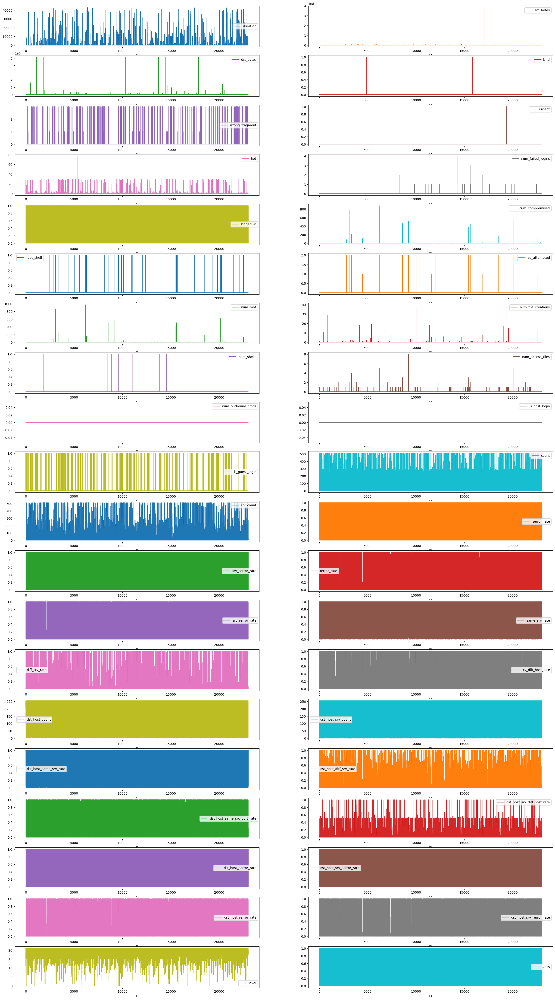

In [17]:
traindata.plot(subplots=True,layout=(20,2),figsize=(30,55),sharex=False)
plt.show()

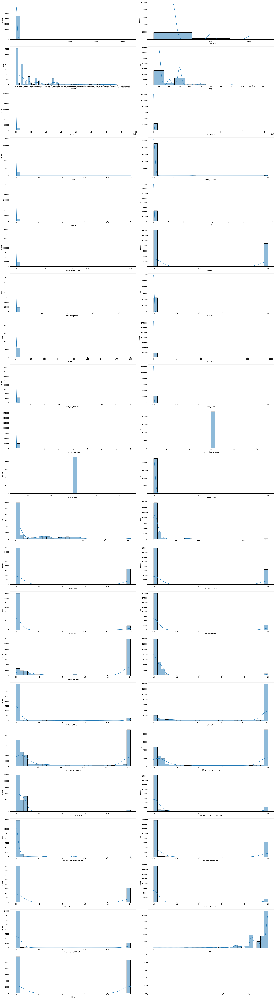

In [18]:
# Create a figure and axes with the specified layout and figsize
fig, axes = plt.subplots(22, 2, figsize=(25, 90))

# Flatten the axes array to iterate over each subplot
axes = axes.flatten()

# Set sharex to False for individual x-axis in each subplot
for ax in axes:
    ax.sharex = False

# Create a histogram with a KDE overlay for each subplot
for i, col in enumerate(traindata.columns):
    sns.histplot(traindata[col], ax=axes[i], kde=True, bins=30)

# Show the plots
plt.tight_layout()
plt.show()

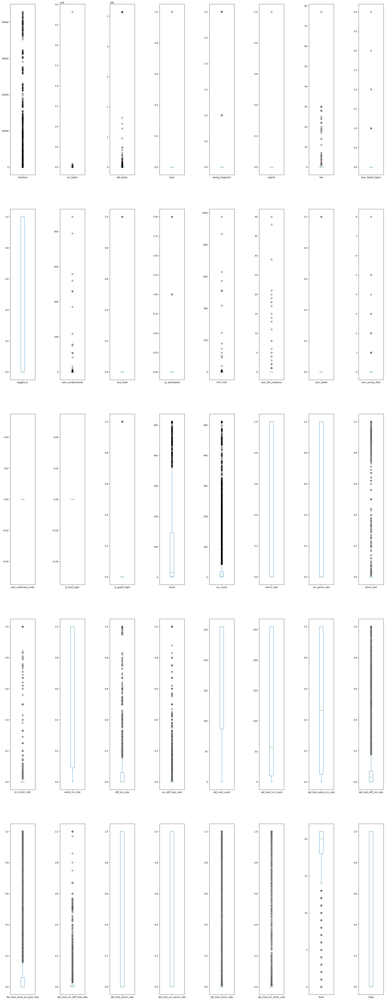

In [19]:
traindata.plot(kind='box',
             subplots=True,
             layout=(5,8),
             figsize=(30,80),
             sharey=False)
plt.subplots_adjust(wspace=1)

In [20]:
columns_with_outliers

['duration',
 'src_bytes',
 'dst_bytes',
 'land',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'is_guest_login',
 'count',
 'srv_count',
 'rerror_rate',
 'srv_rerror_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'level']

### Outliers & Prepared Binary Categories
From the boxplot & peviously prepared `columns_with_outliers` we can define that:
features (land, urgent, root_shell, num_shells, is_guest_login) are binary prepared features &
featrues (wrong_fragment, num_failed_logins, su_attempted, num_access_files) are discrete count features(contains outliers).

In [21]:
binary_categorical_columns = ['land', 'logged_in', 'is_host_login', 'is_guest_login']
for col in binary_categorical_columns:
    print(col, traindata[col].value_counts())

land land
0    23000
1        2
Name: count, dtype: int64
logged_in logged_in
0    14111
1     8891
Name: count, dtype: int64
is_host_login is_host_login
0    23002
Name: count, dtype: int64
is_guest_login is_guest_login
0    22792
1      210
Name: count, dtype: int64


In [22]:
discrete_count_features = ['wrong_fragment', 'num_failed_logins', 'su_attempted', 'num_access_files']
for col in discrete_count_features:
    print(col, traindata[col].value_counts())

wrong_fragment wrong_fragment
0    22792
3      174
1       36
Name: count, dtype: int64
num_failed_logins num_failed_logins
0    22982
1       16
2        2
4        1
3        1
Name: count, dtype: int64
su_attempted su_attempted
0    22984
2       13
1        5
Name: count, dtype: int64
num_access_files num_access_files
0    22934
1       55
2        7
5        2
3        2
4        1
8        1
Name: count, dtype: int64


In [23]:
# Drop binary categorical columns from columns_with_outliers
columns_with_outliers = [col for col in columns_with_outliers if col not in binary_categorical_columns]
columns_with_outliers

['duration',
 'src_bytes',
 'dst_bytes',
 'wrong_fragment',
 'urgent',
 'hot',
 'num_failed_logins',
 'num_compromised',
 'root_shell',
 'su_attempted',
 'num_root',
 'num_file_creations',
 'num_shells',
 'num_access_files',
 'count',
 'srv_count',
 'rerror_rate',
 'srv_rerror_rate',
 'diff_srv_rate',
 'srv_diff_host_rate',
 'dst_host_diff_srv_rate',
 'dst_host_same_src_port_rate',
 'dst_host_srv_diff_host_rate',
 'dst_host_rerror_rate',
 'dst_host_srv_rerror_rate',
 'level']

c:\Users\debi\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\plotting\_matplotlib\misc.py:101: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[j])
c:\Users\debi\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\plotting\_matplotlib\misc.py:102: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(boundaries_list[i])
c:\Users\debi\AppData\Local\Programs\Python\Python311\Lib\site-packages\pandas\plotting\_matplotlib\misc.py:92: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(boundaries_list[i])


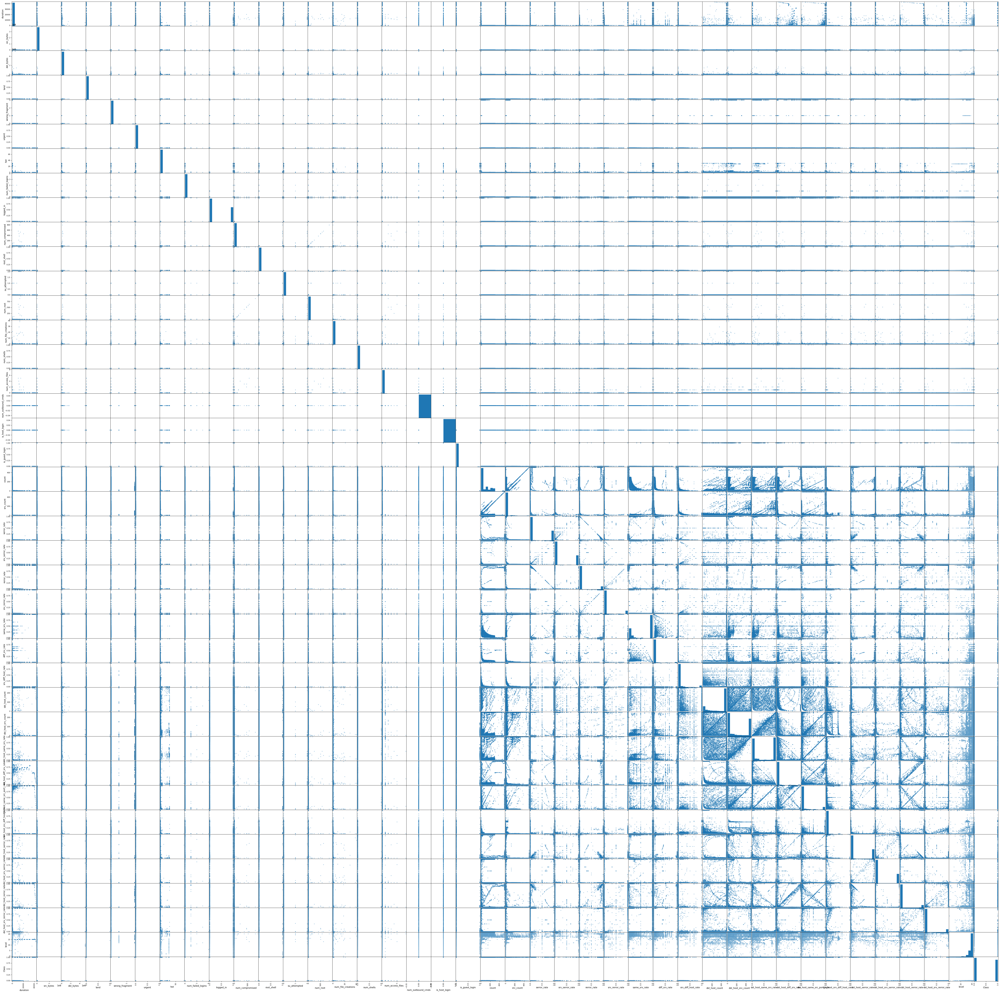

In [24]:
pd.plotting.scatter_matrix(traindata, figsize=(80,80))
plt.show()

In [25]:
correlation_matrix = traindata[numeric_columns].corr()
correlation_matrix["Class"].sort_values(ascending=False)

Class                          1.000000
dst_host_srv_serror_rate       0.649963
dst_host_serror_rate           0.647599
serror_rate                    0.646637
srv_serror_rate                0.644097
count                          0.576296
dst_host_count                 0.368795
dst_host_srv_rerror_rate       0.258675
rerror_rate                    0.258556
dst_host_rerror_rate           0.258102
srv_rerror_rate                0.257691
dst_host_diff_srv_rate         0.236590
diff_srv_rate                  0.192442
wrong_fragment                 0.096417
dst_host_same_src_port_rate    0.090074
dst_host_srv_diff_host_rate    0.063555
duration                       0.049368
urgent                         0.006887
src_bytes                      0.005829
srv_count                      0.002368
num_failed_logins              0.002050
land                           0.000406
dst_bytes                     -0.010218
hot                           -0.012829
num_shells                    -0.017859


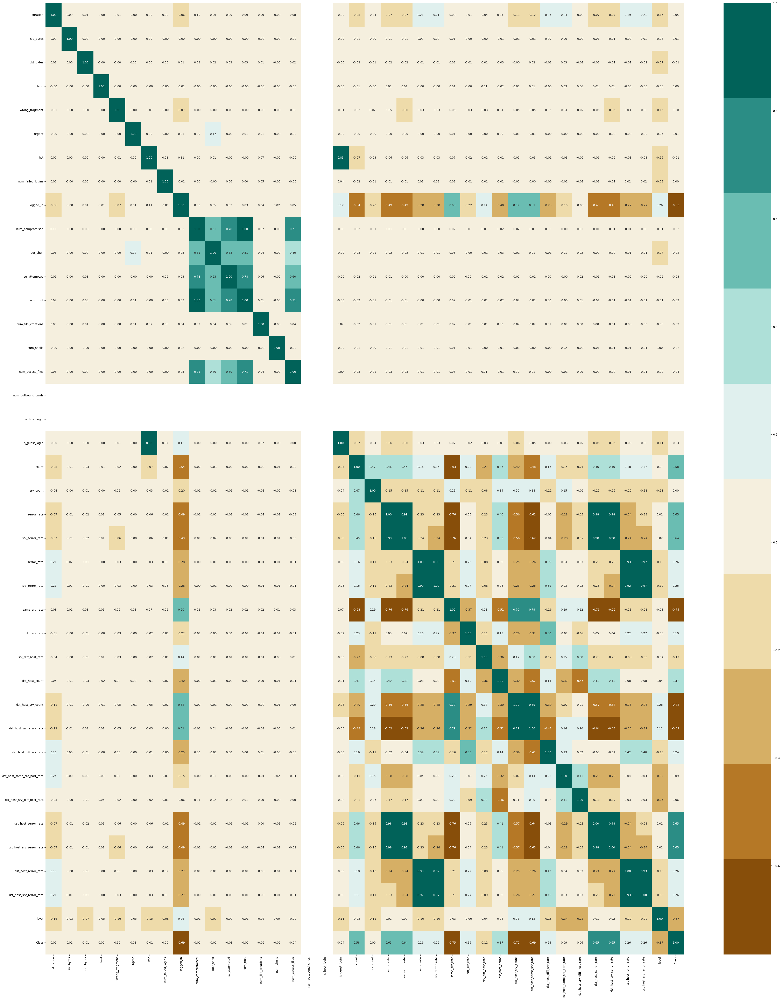

In [26]:
# Plot figsize
fig, ax = plt.subplots(figsize=(50, 60))
# Generate Color Map
# colormap = sns.diverging_palette(220, 10, as_cmap=True)
colormap = sns.color_palette("BrBG", 10)
# Generate Heat Map, allow annotations and place floats in map
sns.heatmap(correlation_matrix, cmap=colormap, annot=True, fmt=".2f")
#ax.set_yticklabels(column_names);
plt.show()

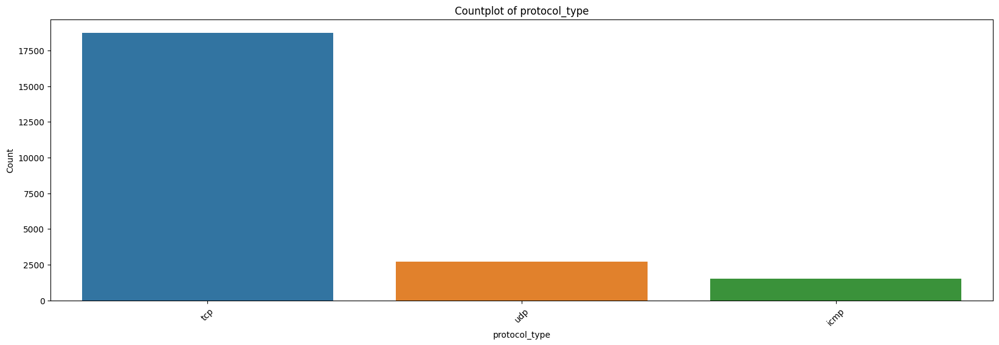

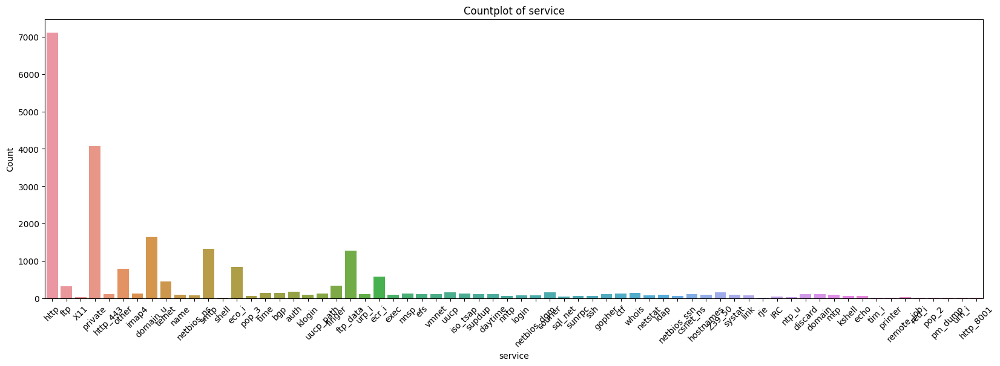

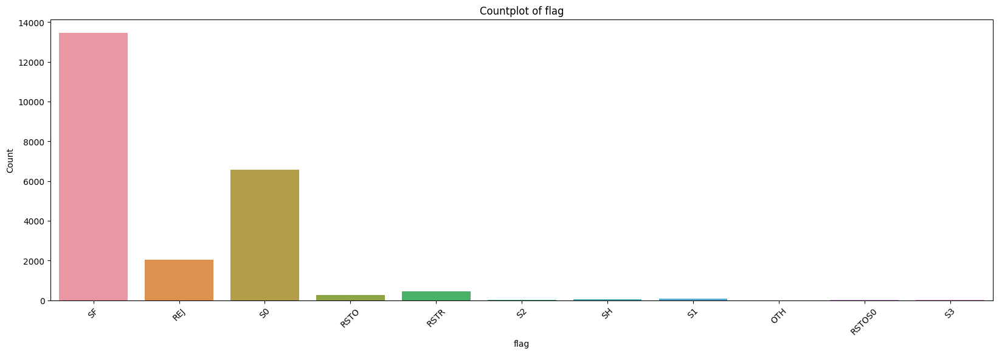

In [27]:
# Plot Countplots for categorical columns
for col in categorical_columns:
    plt.figure(figsize=(20, 6))
    sns.countplot(data=traindata, x=col)
    plt.title(f'Countplot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

Label values and their counts:
Class
0    12001
1    11001
Name: count, dtype: int64


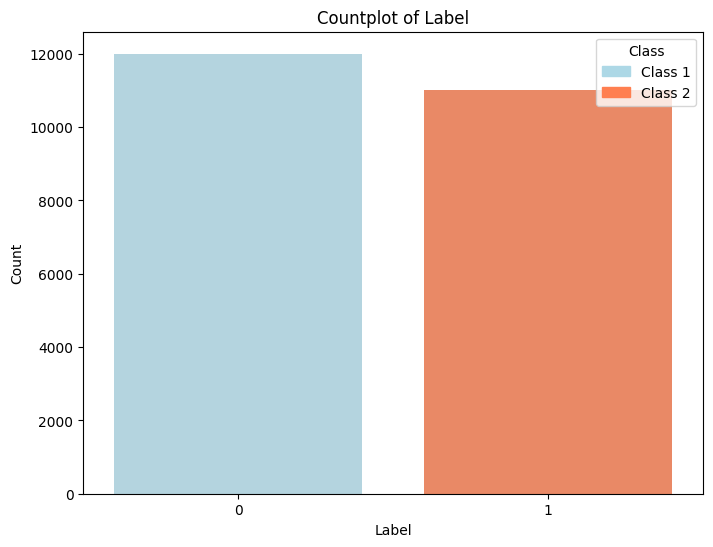

In [28]:
print("Label values and their counts:")
print(traindata['Class'].value_counts())
# Bar plot for the 'label' column
colors = ['lightblue', 'coral']
plt.figure(figsize=(8, 6))
sns.countplot(data=traindata, x='Class', palette=colors)
plt.title('Countplot of Label')
plt.xlabel('Label')
plt.ylabel('Count')

# Create a legend with custom labels and colors
legend_labels = ['Class 1', 'Class 2']
handles = [plt.Rectangle((0, 0), 1, 1, color=color, label=label) for color, label in zip(colors, legend_labels)]
plt.legend(handles=handles, title='Class')
plt.show()

# Feature Engineering & Training

In [29]:
# read .csv files by names traindata & testdata to pandas dataframes
traindata = pd.read_csv('traindata.csv', index_col=0)
testdata = pd.read_csv('testdata.csv', index_col=0)
print(traindata.shape, testdata.shape)

(23002, 43) (22501, 42)


#### Note:
Here am supposed to remove also binary columns from numeric ones but i did it by mistake at first & it provided better results than when i removed them so i kept them.
probably because each instance of a pair of those binary duplicated features pass through two different preprocessing steps one for numerical & other for binary resulting in two different values from same feature (Data Augmentation). 

In [30]:
# List of binary categorical columns
binary_categorical_columns = ['land', 'logged_in', 'is_host_login', 'is_guest_login']
# List of categorical columns
categorical_columns = list(traindata.columns[traindata.dtypes == 'object'])
# List of numeric features (excluding categorical_columns)
numeric_columns = [col for col in traindata.columns if col not in categorical_columns] #Note: and col not in binary_categorical_columns
categorical_columns

['protocol_type', 'service', 'flag']

In [31]:
# List of columns propably contains outliers
columns_with_outliers = []
for column in numeric_columns:
    Q1 = traindata[column].quantile(0.25)
    Q3 = traindata[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    if traindata[(traindata[column] < lower_bound) | (traindata[column] > upper_bound)].any(axis=None):
        columns_with_outliers.append(column)
# Drop columns_with_outliers from numeric_columns
numeric_columns = [col for col in numeric_columns if col not in columns_with_outliers]
# Drop binary categorical columns from columns_with_outliers
columns_with_outliers = [col for col in columns_with_outliers if col not in binary_categorical_columns]

In [32]:
# Create a list of numeric features
numeric_features = numeric_columns[:-1]
# Create a list of outliers features
outliers_features = columns_with_outliers
# Create a list of binary categorical features
binary_categorical_features = binary_categorical_columns
# Create a list of categorical features
categorical_features = categorical_columns

In [42]:
# Split traindata into train and validation sets
X_train = traindata.drop('Class', axis=1)
y_train = traindata['Class']

In [43]:
#Split X_train and y_train into train and validation sets 60:40 ratio stratified sampling
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.4, stratify=y_train, random_state=777)

### Training Best Models Pipeline
after extracting best features, selected top 3 models that resulted highest f1-score on submission which are:(GradientBoostingClassifier, CatBoostClassifier, XGboostClassifier) & trained them using best features preporcessing pipeline & hyperparameter tuned each single one of the 3 models as to improve them(I did it manually since i tried it by grid search & took very much time with catboost & degraded f1-score) then tried create a voting classifier from them but it didn't improve the results significantly but improved a bit. 

In [45]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [
  
    # Gradient Boosting
    ('GradientBoosting', GBC(random_state=777,)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
    #""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
    # NOTE  give the threat or anomly higher weightage as it is more important to detect them especially if data is imbalanced 
    #""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""""
    # CatBoost                           
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],)),
                                        
    # Voting
                    
    ('Voting_gb_xgb_cb_weighted', VC(estimators=[
                                    ('gb', GBC(random_state=777,)),
                                    ('xgb', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
                                    ('cb', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],))],
                                    voting='hard', weights=[1, 3, 2])),
    
    ('Voting_xgb_cb', VC(estimators=[
                                    ('xgb', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
                                    ('cb', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],))],
                                    voting='hard')),
                    
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


GradientBoosting
XGBoost
CatBoost
Voting_gb_xgb_cb_weighted
Voting_xgb_cb


,GradientBoosting,XGBoost,CatBoost,Voting_gb_xgb_cb_weighted,Voting_xgb_cb
0,0,0,0,0,0
1,0,0,0,0,0
2,1,1,1,1,1
3,0,0,0,0,0
4,0,0,0,0,0


### Evaluate Models On Validation Set

In [46]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                       Model  Validation F1-Score
3           GradientBoosting         0.9946718059
1  Voting_gb_xgb_cb_weighted         0.9860736748
2              Voting_xgb_cb         0.9860736748
0                   CatBoost         0.9841198837
4                    XGBoost         0.9739323350


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,CatBoost,0.0007365132,0.9841198837,0.9848563969,0.9845668949,0.9852909209
1,Voting_gb_xgb_cb_weighted,0.0009023732,0.9860736748,0.9869760479,0.9865232040,0.9873922180
2,Voting_xgb_cb,0.0009023732,0.9860736748,0.9869760479,0.9865232040,0.9873922180
3,GradientBoosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,XGBoost,0.0017243428,0.9739323350,0.9756566778,0.9744592979,0.9761611477


## Train on whole Data & Save Results to CSV

In [38]:
# Split traindata into train and validation sets
X_train = traindata.drop('Class', axis=1)
y_train = traindata['Class']
#set testdata as X_test
X_test = testdata.copy()

In [39]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [
  
    # Gradient Boosting
    ('GradientBoosting', GBC(random_state=777,)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],)),
    # Voting
                    
    ('Voting_gb_xgb_cb_weighted', VC(estimators=[
                                    ('gb', GBC(random_state=777,)),
                                    ('xgb', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
                                    ('cb', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],))],
                                    voting='hard', weights=[1, 3, 2])),
    
    ('Voting_xgb_cb', VC(estimators=[
                                    ('xgb', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
                                    ('cb', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],))],
                                    voting='hard')),
                    
]

# Create a dictionary to store the results
test_results = {}

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)
    # Get the predictions
    test_preds = pipeline.predict(X_test)
    # Save the results in the dictionary
    test_results[name] = test_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(test_results)
results_df.head()


GradientBoosting
XGBoost
CatBoost
Voting_gb_xgb_cb_weighted
Voting_xgb_cb


,GradientBoosting,XGBoost,CatBoost,Voting_gb_xgb_cb_weighted,Voting_xgb_cb
0,0,1,1,1,1
1,1,1,1,1,1
2,0,0,1,0,0
3,0,0,0,0,0
4,1,1,1,1,1


### Output .CSV file of best models

In [41]:
# Assuming your 'results_df' contains the model predictions, make sure the index corresponds to the 'ID' in the test data
results_df.index = testdata.index

# Iterate through each model's results and create CSV files
for model_name, model_results in results_df.items():
    # Create a DataFrame with 'ID' and 'Class' columns
    model_df = pd.DataFrame({'ID': results_df.index, 'Class': model_results})

    # Save the DataFrame to a CSV file named after the model
    model_csv_filename = f'{model_name}_results.csv'
    model_df.to_csv(model_csv_filename, index=False)

### Now we can submit the results to kaggle
check ouput folder

## List of Trials

### Trial 1

In [148]:
# Create a preprocessing pipeline
preprocess = ColumnTransformer([
    ('num', 'passthrough', numeric_features),
    # ('cat', 'passthrough', categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=200)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777))
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


,Logistic Regression,Decision Tree,Random Forest,XGBoost
0,0,0,0,0
1,0,0,0,0
2,1,1,1,1
3,0,0,0,0
4,0,0,0,0


In [236]:
# Calculate f1-score and accuracy on train set
print("Train set results:")
for name, preds in train_results.items():
    print(f"{name}:")
    print(f"f1-score: {f1_score(y_train, preds)}")
    print(f"accuracy: {accuracy_score(y_train, preds)}")
    print()

# Calculate f1-score and accuracy on validation set
print("Validation set results:")
for name, preds in val_results.items():
    print(f"{name}:")
    print(f"f1-score: {f1_score(y_val, preds)}")
    print(f"accuracy: {accuracy_score(y_val, preds)}")
    print()

Train set results:
Logistic Regression:
f1-score: 0.9743395655135871
accuracy: 0.9754365625679299

Decision Tree:
f1-score: 1.0
accuracy: 1.0

Random Forest:
f1-score: 1.0
accuracy: 1.0

XGBoost:
f1-score: 1.0
accuracy: 1.0

CatBoost:
f1-score: 0.999924259637961
accuracy: 0.9999275414825013

Validation set results:
Logistic Regression:
f1-score: 0.9740437158469946
accuracy: 0.9752200847733942

Decision Tree:
f1-score: 0.9956896551724139
accuracy: 0.9958700141288991

Random Forest:
f1-score: 0.9979550102249488
accuracy: 0.9980436909031627

XGBoost:
f1-score: 0.9981822313110656
accuracy: 0.9982610585805891

CatBoost:
f1-score: 0.998295648221793
accuracy: 0.9983697424193022



### Trial 2

In [341]:
# Create a preprocessing pipeline
preprocess = ColumnTransformer([
    ('num', StandardScaler(), numeric_features), 
    ('cat', OneHotEncoder(handle_unknown="ignore"), categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False))
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


,Logistic Regression,Decision Tree,Random Forest,XGBoost,CatBoost
0,0,0,0,0,0
1,0,0,0,0,0
2,1,1,1,1,1
3,0,0,0,0,0
4,0,0,0,0,0


In [342]:
# Calculate f1-score and accuracy on train set
print("Train set results:")
for name, preds in train_results.items():
    print(f"{name}:")
    print(f"f1-score: {f1_score(y_train, preds)}")
    print(f"accuracy: {accuracy_score(y_train, preds)}")
    print()

# Calculate f1-score and accuracy on validation set
print("Validation set results:")
for name, preds in val_results.items():
    print(f"{name}:")
    print(f"f1-score: {f1_score(y_val, preds)}")
    print(f"accuracy: {accuracy_score(y_val, preds)}")
    print()

Train set results:
Logistic Regression:
f1-score: 0.9871542995315098
accuracy: 0.9876820520252155

Decision Tree:
f1-score: 1.0
accuracy: 1.0

Random Forest:
f1-score: 1.0
accuracy: 1.0

XGBoost:
f1-score: 1.0
accuracy: 1.0

CatBoost:
f1-score: 0.999924259637961
accuracy: 0.9999275414825013

Validation set results:
Logistic Regression:
f1-score: 0.9879572824358099
accuracy: 0.9884795130964026

Decision Tree:
f1-score: 0.9964776729917055
accuracy: 0.9966308009998913

Random Forest:
f1-score: 0.9980662040723467
accuracy: 0.9981523747418759

XGBoost:
f1-score: 0.9981822313110656
accuracy: 0.9982610585805891

CatBoost:
f1-score: 0.9988636363636364
accuracy: 0.9989131616128681



### Trial 3

In [425]:
# Preprocess the numerical features
numerical_processor = Pipeline([
   ('var', VarianceThreshold()),
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False))
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


,Logistic Regression,Decision Tree,Random Forest,XGBoost,CatBoost
0,0,0,0,0,0
1,0,0,0,0,0
2,1,1,1,1,1
3,0,0,0,0,0
4,0,0,0,0,0


In [417]:
# Calculate f1-score and accuracy on train set
print("Train set results:")
for name, preds in train_results.items():
    print(f"{name}:")
    print(f"f1-score: {f1_score(y_train, preds)}")
    print(f"accuracy: {accuracy_score(y_train, preds)}")
    print()

# Calculate f1-score and accuracy on validation set
print("Validation set results:")
for name, preds in val_results.items():
    print(f"{name}:")
    print(f"f1-score: {f1_score(y_val, preds)}")
    print(f"accuracy: {accuracy_score(y_val, preds)}")
    print()

Train set results:
Logistic Regression:
f1-score: 0.9871542995315098
accuracy: 0.9876820520252155

Decision Tree:
f1-score: 1.0
accuracy: 1.0

Random Forest:
f1-score: 1.0
accuracy: 1.0

XGBoost:
f1-score: 1.0
accuracy: 1.0

CatBoost:
f1-score: 0.999924259637961
accuracy: 0.9999275414825013

Validation set results:
Logistic Regression:
f1-score: 0.9879572824358099
accuracy: 0.9884795130964026

Decision Tree:
f1-score: 0.9964776729917055
accuracy: 0.9966308009998913

Random Forest:
f1-score: 0.9980662040723467
accuracy: 0.9981523747418759

XGBoost:
f1-score: 0.9981822313110656
accuracy: 0.9982610585805891

CatBoost:
f1-score: 0.9988636363636364
accuracy: 0.9989131616128681



### Trial 4

In [484]:
# Preprocess the numerical features
numerical_processor = Pipeline([
   ('var', VarianceThreshold()),
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Naive Bayes
    ('Gaussian Naive Bayes', GNB()),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=7)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Gaussian Naive Bayes
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Gaussian Naive Bayes,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []

# Calculate f1-score and accuracy on train set
for name, preds in train_results.items():
    model_names.append(name)
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)

# Calculate f1-score and accuracy on validation set
for name, preds in val_results.items():
    val_f1 = f1_score(y_val, preds)
    val_acc = accuracy_score(y_val, preds)
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by='Validation F1-Score', ascending=False)

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

,Model,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Voting_xgb_cat_etc,0.9989769240,1.0000000000,0.9990218455,1.0000000000
1,Voting_xgb_cat_rf,0.9989766913,1.0000000000,0.9990218455,1.0000000000
2,CatBoost,0.9988636364,0.9999242596,0.9989131616,0.9999275415
3,XGBoost,0.9981822313,1.0000000000,0.9982610586,1.0000000000
4,Extra Trees,0.9981797497,1.0000000000,0.9982610586,1.0000000000
5,Random Forest,0.9979522184,1.0000000000,0.9980436909,1.0000000000
6,Bagging,0.9971594137,0.9998485078,0.9972829040,0.9998550830
7,Gradient Boosting,0.9969349529,0.9992429977,0.9970655364,0.9992754148
8,Decision Tree,0.9969328638,1.0000000000,0.9970655364,1.0000000000
9,K-Nearest Neighbors,0.9957921074,0.9971988796,0.9959786980,0.9973190349


### Trial 5

In [ ]:
# Preprocess the numerical features
num_top_features = 15

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=7)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []

# Calculate f1-score and accuracy on train set
for name, preds in train_results.items():
    model_names.append(name)
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)

# Calculate f1-score and accuracy on validation set
for name, preds in val_results.items():
    val_f1 = f1_score(y_val, preds)
    val_acc = accuracy_score(y_val, preds)
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by='Validation F1-Score', ascending=False)

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

,Model,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Voting_xgb_cat_rf,0.9984087293,1.0000000000,0.9984784263,1.0000000000
1,Voting_xgb_cat_etc,0.9982952608,1.0000000000,0.9983697424,1.0000000000
2,Random Forest,0.9982940976,1.0000000000,0.9983697424,1.0000000000
3,XGBoost,0.9981818182,1.0000000000,0.9982610586,1.0000000000
4,Extra Trees,0.9980666439,1.0000000000,0.9981523747,1.0000000000
5,CatBoost,0.9979540805,0.9996971074,0.9980436909,0.9997101659
6,K-Nearest Neighbors,0.9968217934,0.9974277500,0.9969568525,0.9975364104
7,Bagging,0.9964736662,0.9996211260,0.9966308010,0.9996377074
8,Support Vector Machine,0.9960276927,0.9953924012,0.9961960656,0.9955800304
9,Decision Tree,0.9953393202,1.0000000000,0.9955439626,1.0000000000


### Trial 6

In [ ]:
# Preprocess the numerical features
num_top_features = 15

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=mutual_info_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=7)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
2        Voting_xgb_cat_rf         0.9984087293
4       Voting_xgb_cat_etc         0.9982952608
5            Random Forest         0.9982940976
7                  XGBoost         0.9981818182
8              Extra Trees         0.9980666439
6                 CatBoost         0.9979540805
0      K-Nearest Neighbors         0.9968217934
10                 Bagging         0.9964736662
1   Support Vector Machine         0.9960276927
13           Decision Tree         0.9953393202
3        Gradient Boosting         0.9946693887
11                AdaBoost         0.9871313062
12     Logistic Regression         0.9837997054
9    Bernoulli Naive Bayes         0.8964172557


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0006059566,0.9968217934,0.9974277500,0.9969568525,0.9975364104
1,Support Vector Machine,0.0006352914,0.9960276927,0.9953924012,0.9961960656,0.9955800304
2,Voting_xgb_cat_rf,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
3,Gradient Boosting,0.0017002982,0.9946693887,0.9963696869,0.9948918596,0.9965219912
4,Voting_xgb_cat_etc,0.0017047392,0.9982952608,1.0000000000,0.9983697424,1.0000000000
5,Random Forest,0.0017059024,0.9982940976,1.0000000000,0.9983697424,1.0000000000
6,CatBoost,0.0017430269,0.9979540805,0.9996971074,0.9980436909,0.9997101659
7,XGBoost,0.0018181818,0.9981818182,1.0000000000,0.9982610586,1.0000000000
8,Extra Trees,0.0019333561,0.9980666439,1.0000000000,0.9981523747,1.0000000000
9,Bernoulli Naive Bayes,0.0027444600,0.8964172557,0.8991617156,0.9076187371,0.9102238968


### Trail 7

In [ ]:
# Preprocess the numerical features
num_top_features = 20

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=7)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf         0.9981809914
5            Random Forest         0.9981805777
2                 CatBoost         0.9980684013
6       Voting_xgb_cat_etc         0.9980675230
7                  XGBoost         0.9978411544
10             Extra Trees         0.9973824969
1      K-Nearest Neighbors         0.9964808718
0   Support Vector Machine         0.9963718821
12                 Bagging         0.9960168431
8        Gradient Boosting         0.9950113379
13           Decision Tree         0.9948822927
9      Logistic Regression         0.9873763221
11                AdaBoost         0.9838379240
3    Bernoulli Naive Bayes         0.9025739716


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0002975955,0.9963718821,0.9960742866,0.9965221172,0.9962321571
1,K-Nearest Neighbors,0.0014008047,0.9964808718,0.9978816765,0.9966308010,0.9979711615
2,CatBoost,0.0016287061,0.9980684013,0.9996971074,0.9981523747,0.9997101659
3,Bernoulli Naive Bayes,0.0018059418,0.9025739716,0.9043799134,0.9119660906,0.9136294471
4,Voting_xgb_cat_rf,0.0018190086,0.9981809914,1.0000000000,0.9982610586,1.0000000000
5,Random Forest,0.0018194223,0.9981805777,1.0000000000,0.9982610586,1.0000000000
6,Voting_xgb_cat_etc,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
7,XGBoost,0.0021588456,0.9978411544,1.0000000000,0.9979350071,1.0000000000
8,Gradient Boosting,0.0023417590,0.9950113379,0.9973530969,0.9952179111,0.9974639519
9,Logistic Regression,0.0024144842,0.9873763221,0.9849618378,0.9879360939,0.9855807550


### Trail 8

In [ ]:
num_top_features = 25

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Naive Bayes
   # ('Gaussian Naive Bayes', GNB()),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=7)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
test_results = {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    test_preds = pipeline.predict(X_test)
    # Save the results in the dictionary
    test_results[name] = test_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(test_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,1,0,0,0,1,1,0,0,0,0,0,0,0,0
1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
2,0,0,1,0,1,1,1,0,1,1,1,0,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,1,1,1,1,1,1,1,1,1,1,1,1


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
2       Voting_xgb_cat_etc         0.9985222235
4        Voting_xgb_cat_rf         0.9984087293
5                  XGBoost         0.9984083674
6                 CatBoost         0.9981814049
7            Random Forest         0.9980666439
10             Extra Trees         0.9977252047
1      K-Nearest Neighbors         0.9971600591
12                 Bagging         0.9959016393
0   Support Vector Machine         0.9954597049
13           Decision Tree         0.9951097464
11       Gradient Boosting         0.9948962232
9      Logistic Regression         0.9865817603
8                 AdaBoost         0.9816649584
3    Bernoulli Naive Bayes         0.9034432940


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0003846472,0.9954597049,0.9958443521,0.9956526465,0.9960147815
1,K-Nearest Neighbors,0.0004186334,0.9971600591,0.9975786925,0.9972829040,0.9976813274
2,Voting_xgb_cat_etc,0.0014777765,0.9985222235,1.0000000000,0.9985871101,1.0000000000
3,Bernoulli Naive Bayes,0.0015900206,0.9034432940,0.9050333146,0.9128355614,0.9142815738
4,Voting_xgb_cat_rf,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
5,XGBoost,0.0015916326,0.9984083674,1.0000000000,0.9984784263,1.0000000000
6,CatBoost,0.0016671259,0.9981814049,0.9998485307,0.9982610586,0.9998550830
7,Random Forest,0.0019333561,0.9980666439,1.0000000000,0.9981523747,1.0000000000
8,AdaBoost,0.0020113770,0.9816649584,0.9796535814,0.9825019020,0.9805086588
9,Logistic Regression,0.0020152601,0.9865817603,0.9845665002,0.9871753070,0.9852184624


### Trial 9

In [ ]:
# Preprocess the numerical features
num_top_features = 23

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=2)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
2                 CatBoost         0.9984090909
3                  XGBoost         0.9984087293
4       Voting_xgb_cat_etc         0.9984087293
6        Voting_xgb_cat_rf         0.9982952608
8            Random Forest         0.9980662041
9              Extra Trees         0.9980657640
0      K-Nearest Neighbors         0.9970461259
12                 Bagging         0.9962453066
1   Support Vector Machine         0.9954597049
13           Decision Tree         0.9954493743
11       Gradient Boosting         0.9948973807
5      Logistic Regression         0.9864695850
10                AdaBoost         0.9816649584
7    Bernoulli Naive Bayes         0.9032258065


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005329330,0.9970461259,0.9975790589,0.9971742202,0.9976813274
1,Support Vector Machine,0.0005357617,0.9954597049,0.9959954666,0.9956526465,0.9961596986
2,CatBoost,0.0014394398,0.9984090909,0.9998485307,0.9984784263,0.9998550830
3,XGBoost,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
4,Voting_xgb_cat_etc,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
5,Logistic Regression,0.0016027569,0.9864695850,0.9848668281,0.9870666232,0.9855082965
6,Voting_xgb_cat_rf,0.0017047392,0.9982952608,1.0000000000,0.9983697424,1.0000000000
7,Bernoulli Naive Bayes,0.0018075082,0.9032258065,0.9050333146,0.9126181937,0.9142815738
8,Random Forest,0.0019337959,0.9980662041,1.0000000000,0.9981523747,1.0000000000
9,Extra Trees,0.0019342360,0.9980657640,1.0000000000,0.9981523747,1.0000000000


### Trial 10

In [ ]:
# Preprocess the numerical features
num_top_features = 21

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=2)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf             0.998408
5       Voting_xgb_cat_etc             0.998408
2                 CatBoost             0.998295
6                  XGBoost             0.998295
7            Random Forest             0.998294
8              Extra Trees             0.998066
0      K-Nearest Neighbors             0.997047
12                 Bagging             0.996359
13           Decision Tree             0.996135
1   Support Vector Machine             0.995460
11       Gradient Boosting             0.994897
10     Logistic Regression             0.986806
9                 AdaBoost             0.981665
3    Bernoulli Naive Bayes             0.903008


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0003809531,0.9970467969,0.9974277500,0.9971742202,0.9975364104
1,Support Vector Machine,0.0007610056,0.9954597049,0.9962207105,0.9956526465,0.9963770741
2,CatBoost,0.0014779401,0.9982948733,0.9997728133,0.9983697424,0.9997826244
3,Bernoulli Naive Bayes,0.0015166085,0.9030084236,0.9045250321,0.9124008260,0.9137743642
4,Voting_xgb_cat_rf,0.0015916326,0.9984083674,1.0000000000,0.9984784263,1.0000000000
5,Voting_xgb_cat_etc,0.0015916326,0.9984083674,1.0000000000,0.9984784263,1.0000000000
6,XGBoost,0.0017051267,0.9982948733,1.0000000000,0.9983697424,1.0000000000
7,Random Forest,0.0017062905,0.9982937095,1.0000000000,0.9983697424,1.0000000000
8,Extra Trees,0.0019337959,0.9980662041,1.0000000000,0.9981523747,1.0000000000
9,AdaBoost,0.0020113770,0.9816649584,0.9796535814,0.9825019020,0.9805086588


### Trail 11

In [ ]:
# Preprocess the numerical features
num_top_features = 22

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),  # Add feature selection
    ('sta', StandardScaler()), 
])
# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
]) 

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=2)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
2                 CatBoost         0.9984090909
3                  XGBoost         0.9984087293
4        Voting_xgb_cat_rf         0.9984087293
5       Voting_xgb_cat_etc         0.9984087293
8            Random Forest         0.9981801638
9              Extra Trees         0.9981797497
0      K-Nearest Neighbors         0.9972739664
12                 Bagging         0.9960150290
1   Support Vector Machine         0.9955727097
13           Decision Tree         0.9951064072
11       Gradient Boosting         0.9948973807
6      Logistic Regression         0.9865787079
10                AdaBoost         0.9816649584
7    Bernoulli Naive Bayes         0.9030084236


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0003809243,0.9972739664,0.9976548907,0.9973915879,0.9977537860
1,Support Vector Machine,0.0004974233,0.9955727097,0.9960701330,0.9957613303,0.9962321571
2,CatBoost,0.0014394398,0.9984090909,0.9998485307,0.9984784263,0.9998550830
3,XGBoost,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
4,Voting_xgb_cat_rf,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
5,Voting_xgb_cat_etc,0.0015912707,0.9984087293,1.0000000000,0.9984784263,1.0000000000
6,Logistic Regression,0.0016373534,0.9865787079,0.9849413545,0.9871753070,0.9855807550
7,Bernoulli Naive Bayes,0.0017343739,0.9030084236,0.9047427975,0.9124008260,0.9139917397
8,Random Forest,0.0018198362,0.9981801638,1.0000000000,0.9982610586,1.0000000000
9,Extra Trees,0.0018202503,0.9981797497,1.0000000000,0.9982610586,1.0000000000


### Trail 12

In [ ]:
# Preprocess the numerical features
num_top_features = 20

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features),
    ('categorical_pre', categorical_processor, categorical_features),
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf             0.998181
5            Random Forest             0.998181
2                 CatBoost             0.998068
6       Voting_xgb_cat_etc             0.998068
7                  XGBoost             0.997841
10             Extra Trees             0.997382
1      K-Nearest Neighbors             0.996481
0   Support Vector Machine             0.996372
12                 Bagging             0.996017
8        Gradient Boosting             0.995011
13           Decision Tree             0.994882
9      Logistic Regression             0.987376
11                AdaBoost             0.983838
3    Bernoulli Naive Bayes             0.902574


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0002975955,0.9963718821,0.9960742866,0.9965221172,0.9962321571
1,K-Nearest Neighbors,0.0014008047,0.9964808718,0.9978816765,0.9966308010,0.9979711615
2,CatBoost,0.0016287061,0.9980684013,0.9996971074,0.9981523747,0.9997101659
3,Bernoulli Naive Bayes,0.0018059418,0.9025739716,0.9043799134,0.9119660906,0.9136294471
4,Voting_xgb_cat_rf,0.0018190086,0.9981809914,1.0000000000,0.9982610586,1.0000000000
5,Random Forest,0.0018194223,0.9981805777,1.0000000000,0.9982610586,1.0000000000
6,Voting_xgb_cat_etc,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
7,XGBoost,0.0021588456,0.9978411544,1.0000000000,0.9979350071,1.0000000000
8,Gradient Boosting,0.0023417590,0.9950113379,0.9973530969,0.9952179111,0.9974639519
9,Logistic Regression,0.0024144842,0.9873763221,0.9849618378,0.9879360939,0.9855807550


### Trail 13

In [ ]:
# Preprocess the numerical features
num_top_features = 20

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('categorical_pre', categorical_processor, categorical_features),
    ('binary_passthrough', 'passthrough', binary_categorical_features),
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4       Voting_xgb_cat_etc             0.998181
5        Voting_xgb_cat_rf             0.998181
6                  XGBoost             0.997954
3                 CatBoost             0.997841
8            Random Forest             0.997725
10             Extra Trees             0.997610
0   Support Vector Machine             0.996485
2      K-Nearest Neighbors             0.996481
12                 Bagging             0.996132
7        Gradient Boosting             0.995011
13           Decision Tree             0.994995
9      Logistic Regression             0.987376
11                AdaBoost             0.986095
1    Bernoulli Naive Bayes             0.903906


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0003347905,0.9964848622,0.9961500717,0.9966308010,0.9963046156
1,Bernoulli Naive Bayes,0.0005708345,0.9039060628,0.9044768973,0.9128355614,0.9132671546
2,K-Nearest Neighbors,0.0014008047,0.9964808718,0.9978816765,0.9966308010,0.9979711615
3,CatBoost,0.0017802585,0.9978411544,0.9996214129,0.9979350071,0.9996377074
4,Voting_xgb_cat_etc,0.0018185951,0.9981814049,1.0000000000,0.9982610586,1.0000000000
5,Voting_xgb_cat_rf,0.0018190086,0.9981809914,1.0000000000,0.9982610586,1.0000000000
6,XGBoost,0.0020459195,0.9979540805,1.0000000000,0.9980436909,1.0000000000
7,Gradient Boosting,0.0021909306,0.9950113379,0.9972022684,0.9952179111,0.9973190349
8,Random Forest,0.0022747953,0.9977252047,1.0000000000,0.9978263232,1.0000000000
9,Logistic Regression,0.0023400464,0.9873763221,0.9850362757,0.9879360939,0.9856532135


### Trail 14

In [ ]:
# Preprocess the numerical features
num_top_features = 15

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Preprocess categorical features
categorical_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# Combine all data preprocessors from above
# For each processor/step specify: a name, the actual process, and finally the features to be processed
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('categorical_pre', categorical_processor, categorical_features),
    ('binary_passthrough', 'passthrough', binary_categorical_features),
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4       Voting_xgb_cat_etc             0.998181
5        Voting_xgb_cat_rf             0.998181
6                  XGBoost             0.997954
3                 CatBoost             0.997841
8            Random Forest             0.997725
10             Extra Trees             0.997610
0   Support Vector Machine             0.996485
2      K-Nearest Neighbors             0.996481
12                 Bagging             0.996132
7        Gradient Boosting             0.995011
13           Decision Tree             0.994995
9      Logistic Regression             0.987376
11                AdaBoost             0.986095
1    Bernoulli Naive Bayes             0.903906


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0003347905,0.9964848622,0.9961500717,0.9966308010,0.9963046156
1,Bernoulli Naive Bayes,0.0005708345,0.9039060628,0.9044768973,0.9128355614,0.9132671546
2,K-Nearest Neighbors,0.0014008047,0.9964808718,0.9978816765,0.9966308010,0.9979711615
3,CatBoost,0.0017802585,0.9978411544,0.9996214129,0.9979350071,0.9996377074
4,Voting_xgb_cat_etc,0.0018185951,0.9981814049,1.0000000000,0.9982610586,1.0000000000
5,Voting_xgb_cat_rf,0.0018190086,0.9981809914,1.0000000000,0.9982610586,1.0000000000
6,XGBoost,0.0020459195,0.9979540805,1.0000000000,0.9980436909,1.0000000000
7,Gradient Boosting,0.0021909306,0.9950113379,0.9972022684,0.9952179111,0.9973190349
8,Random Forest,0.0022747953,0.9977252047,1.0000000000,0.9978263232,1.0000000000
9,Logistic Regression,0.0023400464,0.9873763221,0.9850362757,0.9879360939,0.9856532135


### Trail 15

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 70

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# This processor one-hot encodes the categorical features
categorical_only_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# This processor combines one-hot encoded categorical features with binary features
combined_categorical_processor = ColumnTransformer([
    ('categorical', categorical_only_processor, categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

# The combined processor first combines the features and then applies chi2 selection
final_categorical_processor = Pipeline([
    ('combine', combined_categorical_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', final_categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
5                  XGBoost         0.9980684013
6        Voting_xgb_cat_rf         0.9980675230
7       Voting_xgb_cat_etc         0.9980675230
4                 CatBoost         0.9980670836
8              Extra Trees         0.9980662041
9            Random Forest         0.9977257221
10                 Bagging         0.9968160109
2      K-Nearest Neighbors         0.9967079124
0   Support Vector Machine         0.9961425006
1        Gradient Boosting         0.9955777299
13           Decision Tree         0.9955656623
11     Logistic Regression         0.9816659122
12                AdaBoost         0.9779244424
3    Bernoulli Naive Bayes         0.9057153258


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0007514919,0.9961425006,0.9953910087,0.9963047495,0.9955800304
1,Gradient Boosting,0.0007914078,0.9955777299,0.9963691377,0.9957613303,0.9965219912
2,K-Nearest Neighbors,0.0007960586,0.9967079124,0.9975039710,0.9968481687,0.9976088689
3,Bernoulli Naive Bayes,0.0013707776,0.9057153258,0.9070861035,0.9155526573,0.9169625389
4,CatBoost,0.0016300238,0.9980670836,0.9996971074,0.9981523747,0.9997101659
5,XGBoost,0.0019315987,0.9980684013,1.0000000000,0.9981523747,1.0000000000
6,Voting_xgb_cat_rf,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
7,Voting_xgb_cat_etc,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
8,Extra Trees,0.0019337959,0.9980662041,1.0000000000,0.9981523747,1.0000000000
9,Random Forest,0.0022742779,0.9977257221,1.0000000000,0.9978263232,1.0000000000


### Trail 16

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 75

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# This processor one-hot encodes the categorical features
categorical_only_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# This processor combines one-hot encoded categorical features with binary features
combined_categorical_processor = ColumnTransformer([
    ('categorical', categorical_only_processor, categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

# The combined processor first combines the features and then applies chi2 selection
final_categorical_processor = Pipeline([
    ('combine', combined_categorical_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', final_categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf         0.9980679623
5            Random Forest         0.9979526843
6                  XGBoost         0.9977272727
7       Voting_xgb_cat_etc         0.9977267561
9              Extra Trees         0.9974965863
8                 CatBoost         0.9972727273
0      K-Nearest Neighbors         0.9968217934
11                 Bagging         0.9965862540
1   Support Vector Machine         0.9960276927
13           Decision Tree         0.9952240164
3        Gradient Boosting         0.9946718059
12     Logistic Regression         0.9837997054
10                AdaBoost         0.9831588530
2    Bernoulli Naive Bayes         0.9056924384


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005305025,0.9968217934,0.9973522959,0.9969568525,0.9974639519
1,Support Vector Machine,0.0007863602,0.9960276927,0.9952413324,0.9961960656,0.9954351134
2,Bernoulli Naive Bayes,0.0015407760,0.9056924384,0.9072332144,0.9155526573,0.9171074560
3,Gradient Boosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,Voting_xgb_cat_rf,0.0019320377,0.9980679623,1.0000000000,0.9981523747,1.0000000000
5,Random Forest,0.0020473157,0.9979526843,1.0000000000,0.9980436909,1.0000000000
6,XGBoost,0.0022727273,0.9977272727,1.0000000000,0.9978263232,1.0000000000
7,Voting_xgb_cat_etc,0.0022732439,0.9977267561,1.0000000000,0.9978263232,1.0000000000
8,CatBoost,0.0024243801,0.9972727273,0.9996971074,0.9973915879,0.9997101659
9,Extra Trees,0.0025034137,0.9974965863,1.0000000000,0.9976089555,1.0000000000


### Trail 17

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 76

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# This processor one-hot encodes the categorical features
categorical_only_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# This processor combines one-hot encoded categorical features with binary features
combined_categorical_processor = ColumnTransformer([
    ('categorical', categorical_only_processor, categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

# The combined processor first combines the features and then applies chi2 selection
final_categorical_processor = Pipeline([
    ('combine', combined_categorical_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', final_categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf             0.998181
5       Voting_xgb_cat_etc             0.998068
6            Random Forest             0.997839
8                  XGBoost             0.997727
7                 CatBoost             0.997500
9              Extra Trees             0.997383
0      K-Nearest Neighbors             0.996822
11                 Bagging             0.996587
1   Support Vector Machine             0.996028
13           Decision Tree             0.995223
3        Gradient Boosting             0.994672
12     Logistic Regression             0.983800
10                AdaBoost             0.983159
2    Bernoulli Naive Bayes             0.905692


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005305025,0.9968217934,0.9973522959,0.9969568525,0.9974639519
1,Support Vector Machine,0.0007863602,0.9960276927,0.9952413324,0.9961960656,0.9954351134
2,Bernoulli Naive Bayes,0.0015407760,0.9056924384,0.9072332144,0.9155526573,0.9171074560
3,Gradient Boosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,Voting_xgb_cat_rf,0.0018185951,0.9981814049,1.0000000000,0.9982610586,1.0000000000
5,Voting_xgb_cat_etc,0.0019320377,0.9980679623,1.0000000000,0.9981523747,1.0000000000
6,Random Forest,0.0021608097,0.9978391903,1.0000000000,0.9979350071,1.0000000000
7,CatBoost,0.0021971074,0.9975000000,0.9996971074,0.9976089555,0.9997101659
8,XGBoost,0.0022727273,0.9977272727,1.0000000000,0.9978263232,1.0000000000
9,Extra Trees,0.0026169075,0.9973830925,1.0000000000,0.9975002717,1.0000000000


### Trail 18 Best Feature Selection Number

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf         0.9980675230
6       Voting_xgb_cat_etc         0.9978406637
7              Extra Trees         0.9978391903
8                  XGBoost         0.9977272727
9            Random Forest         0.9977246871
5                 CatBoost         0.9976128226
0      K-Nearest Neighbors         0.9968217934
11                 Bagging         0.9961319681
1   Support Vector Machine         0.9960276927
13           Decision Tree         0.9954493743
3        Gradient Boosting         0.9946718059
12     Logistic Regression         0.9837997054
10                AdaBoost         0.9831588530
2    Bernoulli Naive Bayes         0.9056924384


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005305025,0.9968217934,0.9973522959,0.9969568525,0.9974639519
1,Support Vector Machine,0.0007863602,0.9960276927,0.9952413324,0.9961960656,0.9954351134
2,Bernoulli Naive Bayes,0.0015407760,0.9056924384,0.9072332144,0.9155526573,0.9171074560
3,Gradient Boosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,Voting_xgb_cat_rf,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
5,CatBoost,0.0020842848,0.9976128226,0.9996971074,0.9977176394,0.9997101659
6,Voting_xgb_cat_etc,0.0021593363,0.9978406637,1.0000000000,0.9979350071,1.0000000000
7,Extra Trees,0.0021608097,0.9978391903,1.0000000000,0.9979350071,1.0000000000
8,XGBoost,0.0022727273,0.9977272727,1.0000000000,0.9978263232,1.0000000000
9,Random Forest,0.0022753129,0.9977246871,1.0000000000,0.9978263232,1.0000000000


### Trail 19

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 72

numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# This processor one-hot encodes the categorical features
categorical_only_processor = Pipeline([
    ('cat', OneHotEncoder(handle_unknown="ignore")),
])

# This processor combines one-hot encoded categorical features with binary features
combined_categorical_processor = ColumnTransformer([
    ('categorical', categorical_only_processor, categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

# The combined processor first combines the features and then applies chi2 selection
final_categorical_processor = Pipeline([
    ('combine', combined_categorical_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', final_categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
5              Extra Trees         0.9980662041
6       Voting_xgb_cat_etc         0.9979545455
7        Voting_xgb_cat_rf         0.9978411544
4                 CatBoost         0.9978406637
8                  XGBoost         0.9977272727
9            Random Forest         0.9977257221
0      K-Nearest Neighbors         0.9968217934
11                 Bagging         0.9967019220
1   Support Vector Machine         0.9960276927
13           Decision Tree         0.9951075208
3        Gradient Boosting         0.9946718059
12     Logistic Regression         0.9837997054
10                AdaBoost         0.9831588530
2    Bernoulli Naive Bayes         0.9058252427


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005305025,0.9968217934,0.9973522959,0.9969568525,0.9974639519
1,Support Vector Machine,0.0007863602,0.9960276927,0.9952413324,0.9961960656,0.9954351134
2,Bernoulli Naive Bayes,0.0014079717,0.9058252427,0.9072332144,0.9156613412,0.9171074560
3,Gradient Boosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,CatBoost,0.0018564437,0.9978406637,0.9996971074,0.9979350071,0.9997101659
5,Extra Trees,0.0019337959,0.9980662041,1.0000000000,0.9981523747,1.0000000000
6,Voting_xgb_cat_etc,0.0020454545,0.9979545455,1.0000000000,0.9980436909,1.0000000000
7,Voting_xgb_cat_rf,0.0021588456,0.9978411544,1.0000000000,0.9979350071,1.0000000000
8,XGBoost,0.0022727273,0.9977272727,1.0000000000,0.9978263232,1.0000000000
9,Random Forest,0.0022742779,0.9977257221,1.0000000000,0.9978263232,1.0000000000


### Trail 20

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
log_transform_processor = ColumnTransformer([
    ('numeric', 'passthrough', numeric_features),
    ('transformed_outliers', log_transformer, outliers_features)
])

numerical_processor = Pipeline([
    ('log', log_transform_processor),
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('categorical', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
6        Voting_xgb_cat_rf         0.9969272789
7       Voting_xgb_cat_etc         0.9969272789
8            Random Forest         0.9969258795
9                  XGBoost         0.9966996700
5                 CatBoost         0.9965854769
11             Extra Trees         0.9957844366
12                 Bagging         0.9952207556
13           Decision Tree         0.9937563855
3        Gradient Boosting         0.9928352098
10     K-Nearest Neighbors         0.9902050114
4   Support Vector Machine         0.9867670545
0                 AdaBoost         0.9866148038
2      Logistic Regression         0.9695996329
1    Bernoulli Naive Bayes         0.9006414135


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,AdaBoost,0.0000110589,0.9866148038,0.9866037449,0.9872839909,0.9872473009
1,Bernoulli Naive Bayes,0.0004805495,0.9006414135,0.9011219630,0.9107705684,0.9112383161
2,Logistic Regression,0.0008281585,0.9695996329,0.9687714744,0.9711987827,0.9703644663
3,Gradient Boosting,0.0020109324,0.9928352098,0.9948461422,0.9931529182,0.9950728208
4,Support Vector Machine,0.0023006649,0.9867670545,0.9890677194,0.9873926747,0.9895659735
5,CatBoost,0.0026567177,0.9965854769,0.9992421946,0.9967394848,0.9992754148
6,Voting_xgb_cat_rf,0.0029969807,0.9969272789,0.9999242596,0.9970655364,0.9999275415
7,Voting_xgb_cat_etc,0.0029969807,0.9969272789,0.9999242596,0.9970655364,0.9999275415
8,Random Forest,0.0029983801,0.9969258795,0.9999242596,0.9970655364,0.9999275415
9,XGBoost,0.0032245897,0.9966996700,0.9999242596,0.9968481687,0.9999275415


### Trail 21

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 79

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors


Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
5       Voting_xgb_cat_etc             0.998182
6        Voting_xgb_cat_rf             0.998068
7              Extra Trees             0.997953
8                  XGBoost             0.997841
10           Random Forest             0.997725
9                 CatBoost             0.997501
0      K-Nearest Neighbors             0.996709
11                 Bagging             0.996701
1   Support Vector Machine             0.996028
13           Decision Tree             0.995455
2        Gradient Boosting             0.994671
4                 AdaBoost             0.985530
12     Logistic Regression             0.983800
3    Bernoulli Naive Bayes             0.905692


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0006436363,0.9967086596,0.9973522959,0.9968481687,0.9974639519
1,Support Vector Machine,0.0007111796,0.9960276927,0.9953165131,0.9961960656,0.9955075719
2,Gradient Boosting,0.0014730697,0.9946705976,0.9961436673,0.9948918596,0.9963046156
3,Bernoulli Naive Bayes,0.0015407760,0.9056924384,0.9072332144,0.9155526573,0.9171074560
4,AdaBoost,0.0015861041,0.9855303634,0.9839442593,0.9861971525,0.9846387943
5,Voting_xgb_cat_etc,0.0018181818,0.9981818182,1.0000000000,0.9982610586,1.0000000000
6,Voting_xgb_cat_rf,0.0019320377,0.9980679623,1.0000000000,0.9981523747,1.0000000000
7,Extra Trees,0.0020473157,0.9979526843,1.0000000000,0.9980436909,1.0000000000
8,XGBoost,0.0021588456,0.9978411544,1.0000000000,0.9979350071,1.0000000000
9,CatBoost,0.0021965393,0.9975005681,0.9996971074,0.9976089555,0.9997101659


### Trail 22

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
log_transform_processor = ColumnTransformer([
    ('numeric', 'passthrough', numeric_features),
    ('transformed_outliers', exp_transformer, outliers_features)
])

numerical_processor = Pipeline([
    ('log', log_transform_processor),
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features),
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf         0.9980675230
6       Voting_xgb_cat_etc         0.9978406637
7              Extra Trees         0.9978391903
8                  XGBoost         0.9977272727
9            Random Forest         0.9977246871
5                 CatBoost         0.9976128226
0      K-Nearest Neighbors         0.9968217934
11                 Bagging         0.9961319681
1   Support Vector Machine         0.9960276927
13           Decision Tree         0.9954493743
3        Gradient Boosting         0.9946718059
12     Logistic Regression         0.9837997054
10                AdaBoost         0.9831588530
2    Bernoulli Naive Bayes         0.9056924384


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005305025,0.9968217934,0.9973522959,0.9969568525,0.9974639519
1,Support Vector Machine,0.0007863602,0.9960276927,0.9952413324,0.9961960656,0.9954351134
2,Bernoulli Naive Bayes,0.0015407760,0.9056924384,0.9072332144,0.9155526573,0.9171074560
3,Gradient Boosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,Voting_xgb_cat_rf,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
5,CatBoost,0.0020842848,0.9976128226,0.9996971074,0.9977176394,0.9997101659
6,Voting_xgb_cat_etc,0.0021593363,0.9978406637,1.0000000000,0.9979350071,1.0000000000
7,Extra Trees,0.0021608097,0.9978391903,1.0000000000,0.9979350071,1.0000000000
8,XGBoost,0.0022727273,0.9977272727,1.0000000000,0.9978263232,1.0000000000
9,Random Forest,0.0022753129,0.9977246871,1.0000000000,0.9978263232,1.0000000000


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
4        Voting_xgb_cat_rf         0.9980675230
6       Voting_xgb_cat_etc         0.9978406637
7              Extra Trees         0.9978391903
8                  XGBoost         0.9977272727
9            Random Forest         0.9977246871
5                 CatBoost         0.9976128226
0      K-Nearest Neighbors         0.9968217934
11                 Bagging         0.9961319681
1   Support Vector Machine         0.9960276927
13           Decision Tree         0.9954493743
3        Gradient Boosting         0.9946718059
12     Logistic Regression         0.9837997054
10                AdaBoost         0.9831588530
2    Bernoulli Naive Bayes         0.9056924384


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,K-Nearest Neighbors,0.0005305025,0.9968217934,0.9973522959,0.9969568525,0.9974639519
1,Support Vector Machine,0.0007863602,0.9960276927,0.9952413324,0.9961960656,0.9954351134
2,Bernoulli Naive Bayes,0.0015407760,0.9056924384,0.9072332144,0.9155526573,0.9171074560
3,Gradient Boosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,Voting_xgb_cat_rf,0.0019324770,0.9980675230,1.0000000000,0.9981523747,1.0000000000
5,CatBoost,0.0020842848,0.9976128226,0.9996971074,0.9977176394,0.9997101659
6,Voting_xgb_cat_etc,0.0021593363,0.9978406637,1.0000000000,0.9979350071,1.0000000000
7,Extra Trees,0.0021608097,0.9978391903,1.0000000000,0.9979350071,1.0000000000
8,XGBoost,0.0022727273,0.9977272727,1.0000000000,0.9978263232,1.0000000000
9,Random Forest,0.0022753129,0.9977246871,1.0000000000,0.9978263232,1.0000000000


### Trail 23

In [ ]:
# Preprocess the numerical features
num_top_features = 20
num_categ_top_features = 74

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])


# Create a list of classifiers

classifiers = [

    # K-Nearest Neighbors
    ('K-Nearest Neighbors', KNN(n_neighbors=5)),
    # Bernoulli Naive Bayes
    ('Bernoulli Naive Bayes', BNB()), 
    # Logistic Regression
    ('Logistic Regression', LogisticRegression(random_state=777, max_iter=300)),
    # Support Vector Machine
    ('Support Vector Machine', SVC(random_state=777, probability=True, degree=3)),
    # Decision Tree
    ('Decision Tree', DecisionTreeClassifier(random_state=777)),
    # Bagging
    ('Bagging', BC(random_state=777)),
    # Extra Trees
    ('Extra Trees', ETC(random_state=777)),
    # Random Forest
    ('Random Forest', RFC(random_state=777)),
    # AdaBoost
    ('AdaBoost', ABC(random_state=777)),
    # Gradient Boosting
    ('Gradient Boosting', GBC(random_state=777)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False)),
    # Voting
    ('Voting_xgb_cat_rf', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('rf', RFC(random_state=777))], voting='hard')),
    ('Voting_xgb_cat_etc', VC(estimators=[('xgb', xgb.XGBClassifier(random_state=777)), ('cb', CatBoostClassifier(random_state=777, verbose=False)), ('etc', ETC(random_state=777))], voting='hard')),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


K-Nearest Neighbors
Bernoulli Naive Bayes
Logistic Regression
Support Vector Machine
Decision Tree
Bagging
Extra Trees
Random Forest
AdaBoost
Gradient Boosting
XGBoost
CatBoost
Voting_xgb_cat_rf
Voting_xgb_cat_etc


,K-Nearest Neighbors,Bernoulli Naive Bayes,Logistic Regression,Support Vector Machine,Decision Tree,Bagging,Extra Trees,Random Forest,AdaBoost,Gradient Boosting,XGBoost,CatBoost,Voting_xgb_cat_rf,Voting_xgb_cat_etc
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,1,1,1,1,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                     Model  Validation F1-Score
3       Voting_xgb_cat_etc         0.9980684013
5        Voting_xgb_cat_rf         0.9980679623
4                 CatBoost         0.9978411544
7                  XGBoost         0.9978411544
8              Extra Trees         0.9978391903
9            Random Forest         0.9973836879
0   Support Vector Machine         0.9964848622
2      K-Nearest Neighbors         0.9964808718
6        Gradient Boosting         0.9951252692
12                 Bagging         0.9951075208
13           Decision Tree         0.9946548391
10     Logistic Regression         0.9874914715
11                AdaBoost         0.9838379240
1    Bernoulli Naive Bayes         0.9039060628


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,Support Vector Machine,0.0004105757,0.9964848622,0.9960742866,0.9966308010,0.9962321571
1,Bernoulli Naive Bayes,0.0005708345,0.9039060628,0.9044768973,0.9128355614,0.9132671546
2,K-Nearest Neighbors,0.0014008047,0.9964808718,0.9978816765,0.9966308010,0.9979711615
3,Voting_xgb_cat_etc,0.0019315987,0.9980684013,1.0000000000,0.9981523747,1.0000000000
4,CatBoost,0.0019316589,0.9978411544,0.9997728133,0.9979350071,0.9997826244
5,Voting_xgb_cat_rf,0.0019320377,0.9980679623,1.0000000000,0.9981523747,1.0000000000
6,Gradient Boosting,0.0020774222,0.9951252692,0.9972026915,0.9953265949,0.9973190349
7,XGBoost,0.0021588456,0.9978411544,1.0000000000,0.9979350071,1.0000000000
8,Extra Trees,0.0021608097,0.9978391903,1.0000000000,0.9979350071,1.0000000000
9,Random Forest,0.0026163121,0.9973836879,1.0000000000,0.9975002717,1.0000000000


### Trail 24 Final & BEST 

In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

# Create a list of classifiers

classifiers = [
  
    # Gradient Boosting
    ('GradientBoosting', GBC(random_state=777,)),
    # XGBoost
    ('XGBoost', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],)),
    # Voting
                    
    ('Voting_gb_xgb_cb_weighted', VC(estimators=[
                                    ('gb', GBC(random_state=777,)),
                                    ('xgb', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
                                    ('cb', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],))],
                                    voting='hard', weights=[1, 3, 2])),
    
    ('Voting_xgb_cb', VC(estimators=[
                                    ('xgb', xgb.XGBClassifier(random_state=777, learning_rate=0.0001, max_depth=6, scale_pos_weight=10)),
                                    ('cb', CatBoostClassifier(random_state=777, verbose=False, learning_rate=0.001, depth=4, iterations=6500, reg_lambda=3, class_weights=[1, 12],))],
                                    voting='hard')),
                    
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier and fit the pipeline

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    # Fit the pipeline
    pipeline.fit(X_train, y_train)    
    # Get the predictions
    train_preds = pipeline.predict(X_train)
    val_preds = pipeline.predict(X_val)
    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
results_df.head()


GradientBoosting
XGBoost
CatBoost
Voting_gb_xgb_cb_weighted
Voting_xgb_cb


,GradientBoosting,XGBoost,CatBoost,Voting_gb_xgb_cb_weighted,Voting_xgb_cb
0,0,0,0,0,0
1,0,0,0,0,0
2,1,1,1,1,1
3,0,0,0,0,0
4,0,0,0,0,0


In [ ]:
# Create empty lists to store the results
model_names = []
train_f1_scores = []
train_accuracies = []
val_f1_scores = []
val_accuracies = []
f1_scores_diff = []

# Calculate f1-score and accuracy on train set & Test set
for name, preds in train_results.items():
    model_names.append(name)
    # Calculate f1-score and accuracy on train set
    train_f1 = f1_score(y_train, preds)
    train_acc = accuracy_score(y_train, preds)
    train_f1_scores.append(train_f1)
    train_accuracies.append(train_acc)
    # Calculate f1-score and accuracy on validation set
    val_f1 = f1_score(y_val, val_results[name])
    val_acc = accuracy_score(y_val, val_results[name])
    val_f1_scores.append(val_f1)
    val_accuracies.append(val_acc)
    # Calculate the difference between the f1-score on train and validation set
    f1_scores_diff.append(abs(train_f1 - val_f1))

# Create a DataFrame with the results
models_results_df = pd.DataFrame({
    'Model': model_names,
    'F1-Score Difference': f1_scores_diff,
    'Validation F1-Score': val_f1_scores,
    'Train F1-Score': train_f1_scores,
    'Validation Accuracy': val_accuracies,
    'Train Accuracy': train_accuracies
})

# Sort the DataFrame by Validation F1-Score
models_results_df = models_results_df.sort_values(by=['F1-Score Difference', 'Validation F1-Score'])

# Reset the index of the DataFrame
models_results_df.reset_index(drop=True, inplace=True)

print("Models Results Sorted by Validation F1-Score: ")
print(models_results_df.sort_values(by=['Validation F1-Score'], ascending=False)[['Model','Validation F1-Score']])
# Display the sorted DataFrame
decimal_places = 10
pd.options.display.float_format = f'{{:.{decimal_places}f}}'.format
models_results_df

Models Results Sorted by Validation F1-Score: 
                       Model  Validation F1-Score
3           GradientBoosting         0.9946718059
1  Voting_gb_xgb_cb_weighted         0.9860736748
2              Voting_xgb_cb         0.9860736748
0                   CatBoost         0.9841198837
4                    XGBoost         0.9739323350


,Model,F1-Score Difference,Validation F1-Score,Train F1-Score,Validation Accuracy,Train Accuracy
0,CatBoost,0.0007365132,0.9841198837,0.9848563969,0.9845668949,0.9852909209
1,Voting_gb_xgb_cb_weighted,0.0009023732,0.9860736748,0.9869760479,0.9865232040,0.9873922180
2,Voting_xgb_cb,0.0009023732,0.9860736748,0.9869760479,0.9865232040,0.9873922180
3,GradientBoosting,0.0015471898,0.9946718059,0.9962189958,0.9948918596,0.9963770741
4,XGBoost,0.0017243428,0.9739323350,0.9756566778,0.9744592979,0.9761611477


# K best features Analysis

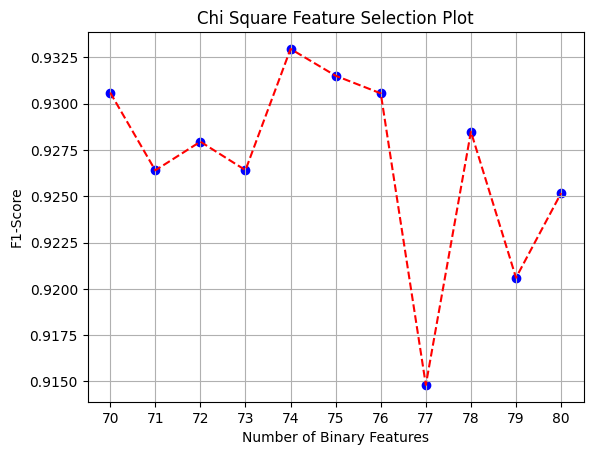

In [45]:
# Data
x = [     77,      80,      73,      76,     70,      75,      74,      78,      72,     71,     79]
y = [0.91481, 0.92517, 0.92641, 0.93056, 0.9306, 0.93151, 0.93296, 0.92849, 0.92795, 0.9264, 0.9206]

# Sort x and y based on x-values
sorted_indices = sorted(range(len(x)), key=lambda k: x[k])
x_sorted = [x[i] for i in sorted_indices]
y_sorted = [y[i] for i in sorted_indices]

# Plotting
plt.scatter(x_sorted, y_sorted, color='blue')
plt.plot(x_sorted, y_sorted, color='red', linestyle='--')
plt.title('Chi Square Feature Selection Plot')
plt.xlabel('Number of Binary Features')
plt.ylabel('F1-Score')
plt.grid(True)

# Setting x-axis ticks with increment of 1
plt.xticks(range(min(x_sorted), max(x_sorted) + 1, 1))

# Display the plot
plt.show()

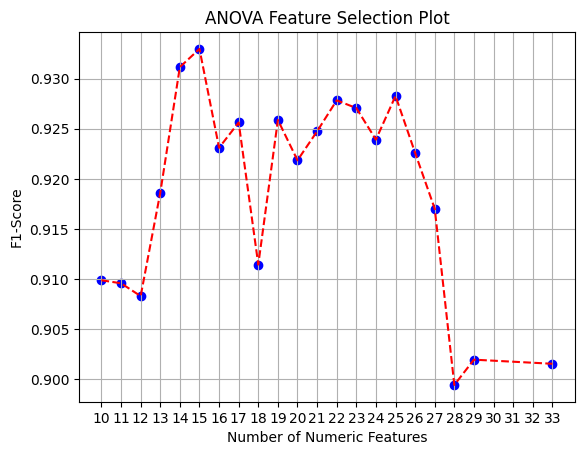

In [126]:
# Data
x = [     15,      20,      10,      17,      18,      19,     16,      14,      13,    12,       11,      23,     22,       21,      24,      25,      27,      26,      28,      29,      33]
y = [0.93296, 0.92185, 0.90988, 0.92562, 0.91145, 0.92587, 0.9231, 0.93115, 0.91861, 0.9083, 0.90958, 0.92706, 0.92783, 0.92474, 0.92391, 0.92827, 0.91702, 0.92259, 0.89944, 0.90196, 0.90155]

# Sort x and y based on x-values
sorted_indices = sorted(range(len(x)), key=lambda k: x[k])
x_sorted = [x[i] for i in sorted_indices]
y_sorted = [y[i] for i in sorted_indices]

# Plotting
plt.scatter(x_sorted, y_sorted, color='blue')
plt.plot(x_sorted, y_sorted, color='red', linestyle='--')
plt.title('ANOVA Feature Selection Plot')
plt.xlabel('Number of Numeric Features')
plt.ylabel('F1-Score')
plt.grid(True)

# Setting x-axis ticks with increment of 1
plt.xticks(range(min(x_sorted), max(x_sorted) + 1, 1))

# Display the plot
plt.show()

# Hyper Parameter Tuning Models Pipeline
I tried grid search on the best model at that time (catboost) but it took almost 12 hrs & didn't improve the score So I tuned Parameters Manually which was more effective.

In [ ]:
def prepare_tuning_data():
    # read .csv files by names traindata & testdata to pandas dataframes
    traindata = pd.read_csv('traindata.csv', index_col=0)
    testdata = pd.read_csv('testdata.csv', index_col=0)
    print(traindata.shape, testdata.shape)
    # List of binary categorical columns
    binary_categorical_columns = ['land', 'logged_in', 'is_host_login', 'is_guest_login']
    # List of categorical columns
    categorical_columns = list(traindata.columns[traindata.dtypes == 'object'])
    # List of numeric features (excluding categorical_columns)
    numeric_columns = [col for col in traindata.columns if col not in categorical_columns] #  and col not in binary_categorical_columns
    print(categorical_columns)
    # List of columns propably contains outliers
    columns_with_outliers = []
    for column in numeric_columns:
        Q1 = traindata[column].quantile(0.25)
        Q3 = traindata[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        if traindata[(traindata[column] < lower_bound) | (traindata[column] > upper_bound)].any(axis=None):
            columns_with_outliers.append(column)
    # Drop columns_with_outliers from numeric_columns
    numeric_columns = [col for col in numeric_columns if col not in columns_with_outliers]
    # Drop binary categorical columns from columns_with_outliers
    columns_with_outliers = [col for col in columns_with_outliers if col not in binary_categorical_columns]
    # Create a list of numeric features
    numeric_features = numeric_columns[:-1]
    # Create a list of outliers features
    outliers_features = columns_with_outliers
    # Create a list of binary categorical features
    binary_categorical_features = binary_categorical_columns
    # Create a list of categorical features
    categorical_features = categorical_columns
    # Split traindata into train and validation sets
    X_train = traindata.drop('Class', axis=1)
    y_train = traindata['Class']
    #Split X_train and y_train into train and validation sets 80:20 ratio stratified sampling since we already cross validated traindata
    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, stratify=y_train, random_state=777)
    return X_train, X_val, y_train, y_val, testdata, numeric_features, outliers_features, binary_categorical_features, categorical_features

In [ ]:
X_train, X_val, y_train, y_val, testdata, numeric_features, outliers_features, binary_categorical_features, categorical_features = prepare_tuning_data()

(23002, 43) (22501, 42)
['protocol_type', 'service', 'flag']


In [ ]:
# Preprocess the numerical features
num_top_features = 15
num_categ_top_features = 74

# Numerical Features Preprocessing
numerical_processor = Pipeline([
    ('var', VarianceThreshold()),
    ('correlation_select', SelectKBest(score_func=f_classif, k=num_top_features)),
    ('sta', StandardScaler()), 
])

# Categorical Features Preprocessing
one_hot_processor = ColumnTransformer([
    ('multivalue_cat', OneHotEncoder(handle_unknown="ignore"), categorical_features),
    ('binary', 'passthrough', binary_categorical_features)
])

categorical_processor = Pipeline([
    ('combine_bin_ohe', one_hot_processor),
    ('chi2_select', SelectKBest(score_func=chi2, k=num_categ_top_features))
])

# All Features Preprocessing
preprocess = ColumnTransformer([
    ('numerical_pre', numerical_processor, numeric_features + outliers_features),
    ('combined_categorical_pre', categorical_processor, categorical_features + binary_categorical_features)
])

# Create a pipeline with the preprocessing steps and the classifier
pipeline = Pipeline([
    ('preprocess', preprocess)
])

catboost_grid = {
    'CatBoost__iterations': [1000, 700, 500, 300, 100],
    'CatBoost__learning_rate': [0.05, 0.1, 0.2, 0.01],
    'CatBoost__depth': [6, 7, 8, 10, 12],
    'CatBoost__early_stopping_rounds': [3, 5, 7, 10, 15],
}

# Create a dictionary to store grids for each classifier
param_grids = {
    'CatBoost': catboost_grid,
}

# Create a dictionary to store the best parameters
best_params = {}

# Create a list of classifiers

classifiers = [
    # CatBoost
    ('CatBoost', CatBoostClassifier(random_state=777)),
]

# Create a dictionary to store the results
train_results, val_results = {}, {}

# Loop through each classifier, fit the pipeline using GridSearchCV

for name, classifier in classifiers:
    print(name)
    pipeline.steps.append([name, classifier])
    
    # GridSearchCV
    grid_search = GridSearchCV(pipeline, param_grids[name], cv=5, verbose=1, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Extract the best estimator and use it for predictions
    best_estimator = grid_search.best_estimator_
    train_preds = best_estimator.predict(X_train)
    val_preds = best_estimator.predict(X_val)

    # Save the results in the dictionary
    train_results[name] = train_preds
    val_results[name] = val_preds
    
    # Store the best parameters for further analysis
    best_params[name] = grid_search.best_params_
    
    # Remove the classifier from the pipeline
    pipeline.steps.pop()

# Create a dataframe with the results
results_df = pd.DataFrame(val_results)
print(best_params)
results_df.head()

# Log Feature Transformation Analysis

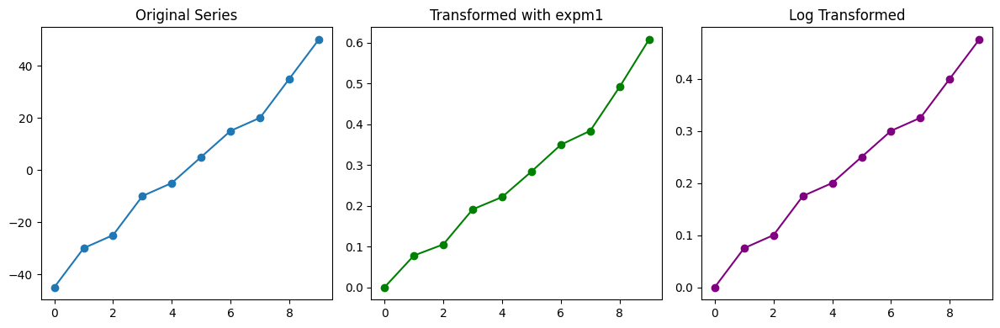

,y,y_transformed,y_log_transformed
0,-45,0.000000,0.000
1,-30,0.077884,0.075
2,-25,0.105171,0.100
3,-10,0.191246,0.175
4,-5,0.221403,0.200
5,5,0.284025,0.250
6,15,0.349859,0.300
7,20,0.384031,0.325
8,35,0.491825,0.400
9,50,0.608014,0.475


In [11]:
# Sample series
# Sort the sample series manually
y = np.array([-45, -30, -25, -10, -5, 5, 15, 20, 35, 50])

def transform_series(y):
    # Apply the transformation
    y_transformed = np.expm1((y + abs(y.min())) / 200)
    y_log_transformed = np.log1p(y_transformed)
    
    return y_transformed, y_log_transformed

# Transform the sample series
y_transformed, y_log_transformed = transform_series(y)

# Plot the original and transformed series
plt.figure(figsize=(12, 4))

plt.subplot(131)
plt.plot(y, marker='o')
plt.title('Original Series')

plt.subplot(132)
plt.plot(y_transformed, marker='o', color='green')
plt.title('Transformed with expm1')

plt.subplot(133)
plt.plot(y_log_transformed, marker='o', color='purple')
plt.title('Log Transformed')

plt.tight_layout()
plt.show()

pd.DataFrame({'y': y, 'y_transformed': y_transformed, 'y_log_transformed': y_log_transformed})